# Photo search algorhitm 📸

Мы работаем в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).

Пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т.д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.

Наш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Нам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно выбрать лучшую модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. На основе лучшей модели можно будет собрать предварительную версию продукта, которую мы покажем руководителю компании.

**Юридические ограничения**

В некоторых странах, где работает компания “With Sense”, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

`This image is unavailable in your country in compliance with local laws.`

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

# 1 - Imports & data

In [ ]:
from IPython.display import clear_output

In [ ]:
%pip install tf-keras==2.16.0 --no-dependencies
%pip install sentence-transformers==4.0.2
%pip install pyarrow==19.0.0

clear_output()

In [ ]:
%pip install -q accelerate==0.26.0
%pip install -q hyperopt==0.2.7
%pip install -q lightgbm==4.5.0
%pip install -q matplotlib==3.8.4
%pip install -q numpy==1.26.4
%pip install -q optree==0.14.0
%pip install -q pandas==2.2.3
%pip install -q prettytable==3.12.0
%pip install -q requests==2.32.3
%pip install -q scikit-learn==1.5.2
%pip install -q termcolor==2.5.0
%pip install -q torch==2.6.0
%pip install -q torchmetrics==1.7.0
%pip install -q torchvision==0.21.0
%pip install -q tqdm==4.66.5
%pip install -q transformers==4.49.0

clear_output()

In [ ]:
import os
import random
import requests
import shutil
import zipfile
from os import path
from functools import lru_cache


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import (DataLoader,
                              Dataset)

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_absolute_error
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import (LinearRegression,
                                  Ridge)
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor

from hyperopt import (hp,
                      fmin,
                      tpe,
                      Trials,
                      STATUS_OK,
                      STATUS_FAIL)

from termcolor import colored
from prettytable import PrettyTable
from tqdm.notebook import tqdm
from PIL import Image
from sentence_transformers import SentenceTransformer
from transformers import (CLIPProcessor,
                          CLIPModel)

In [ ]:
tqdm.pandas()

In [ ]:
RANDOM_STATE = 88
TEST_SIZE = 0.2
DISCLAIMER = 'This image is unavailable in your country in compliance with local laws.'

In [ ]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_STATE)
    torch.cuda.manual_seed_all(RANDOM_STATE)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

Сервисные функции

In [ ]:
def check_duplicates(df: pd.DataFrame) -> None:
    duplicates_count = df.duplicated().sum()

    if duplicates_count == 0:
        print(colored('Полных дубликатов не обнаружено.', 'green'))
        return

    duplicates_part = duplicates_count / len(df)
    print(colored(f'Обнаружено {duplicates_count} дубликатов ({duplicates_part:.2%})', 'red'))

In [ ]:
def check_nans(df: pd.DataFrame) -> None:
    if df.isna().sum().sum() == 0:
        print(colored('Пропусков не обнаружено.', 'green'))
        return

    table = PrettyTable()
    table.field_names = ['Feature', 'Missing values count']

    missing_info = df.isna().sum().sort_values()
    cols = missing_info.index.to_list()
    for col in cols:
        count = missing_info[col]
        color = 'green' if count == 0 else 'red'
        s = f'{count} ({count / len(df):.2%})'
        table.add_row([col, colored(s, color)])

    print(table)

In [ ]:
def create_histogram(
    data: pd.Series,
    bins: int,
    title: str,
    x_label: str
) -> None:

    counts, _, patches = plt.hist(data, bins=bins, edgecolor='black', color='skyblue')

    for i in range(len(counts)):
        plt.text(
            patches[i].get_x() + patches[i].get_width() / 2,
            counts[i] + max(counts) * 0.02,
            str(int(counts[i])),
            ha='center',
            fontsize=10
        )

    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel("Количество", fontsize=12)

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    plt.show()


## Datasets description

В файле `train_dataset.csv` собрана информация, необходимая для обучения:
- имя файла изображения
- идентификатор описания
- текст описания.

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [ ]:
url = 'https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip'
archive_name = path.basename(url)
data_dir = 'data'


In [ ]:
os.makedirs(data_dir, exist_ok=True)
archive_path = os.path.join(data_dir, archive_name)

In [ ]:
if not os.path.exists(archive_path):
    print(f"Скачивание архива '{archive_name}'...")
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(archive_path, 'wb') as file:
            for chunk in response.iter_content(chunk_size=1024):
                file.write(chunk)
        print(f"Архив '{archive_name}' успешно скачан.")
    else:
        print(f"Ошибка при скачивании архива. Код ответа: {response.status_code}")
        raise Exception("Не удалось скачать архив.")
else:
    print(f"Архив '{archive_name}' уже существует. Пропускаем скачивание.")

Архив 'dsplus_integrated_project_4.zip' уже существует. Пропускаем скачивание.


In [ ]:
extract_dir = os.path.join(data_dir, "extracted_data")
to_upload_dir = os.path.join(extract_dir, "to_upload")

In [ ]:
if not os.path.exists(to_upload_dir):
    print("Распаковка ZIP-архива...")
    with zipfile.ZipFile(archive_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)
    print(f"Архив распакован в директорию '{extract_dir}'.")
else:
    print(f"Папка '{to_upload_dir}' уже распакована. Пропускаем распаковку.")

Папка 'data/extracted_data/to_upload' уже распакована. Пропускаем распаковку.


In [ ]:
if os.path.exists(to_upload_dir) and os.path.isdir(to_upload_dir):
    print(f"Обнаружена папка '{to_upload_dir}'. Начинаем перемещение содержимого...")

    for item in os.listdir(to_upload_dir):
        source_path = os.path.join(to_upload_dir, item)
        destination_path = os.path.join(data_dir, item)

        if os.path.exists(destination_path):
            print(f"Файл/папка '{item}' уже существует в '{data_dir}'. Пропускаем...")
            continue

        if os.path.isdir(source_path):
            print(f"Перемещение папки: {item}")
            shutil.move(source_path, data_dir)
        else:
            print(f"Перемещение файла: {item}")
            shutil.move(source_path, data_dir)

    print(f"Все файлы и папки из '{to_upload_dir}' успешно перемещены в '{data_dir}'.")
else:
    print(f"Папка '{to_upload_dir}' не найдена.")

Обнаружена папка 'data/extracted_data/to_upload'. Начинаем перемещение содержимого...
Файл/папка 'test_images' уже существует в 'data'. Пропускаем...
Файл/папка 'test_images.csv' уже существует в 'data'. Пропускаем...
Файл/папка '.DS_Store' уже существует в 'data'. Пропускаем...
Файл/папка 'train_dataset.csv' уже существует в 'data'. Пропускаем...
Файл/папка 'ExpertAnnotations.tsv' уже существует в 'data'. Пропускаем...
Файл/папка 'CrowdAnnotations.tsv' уже существует в 'data'. Пропускаем...
Файл/папка 'train_images' уже существует в 'data'. Пропускаем...
Файл/папка 'test_queries.csv' уже существует в 'data'. Пропускаем...
Все файлы и папки из 'data/extracted_data/to_upload' успешно перемещены в 'data'.


In [ ]:
print("Очистка временных файлов...")
if os.path.exists(to_upload_dir) and not os.listdir(to_upload_dir):
    os.rmdir(to_upload_dir)
    print(f"Пустая папка '{to_upload_dir}' удалена.")

if os.path.exists(extract_dir) and not os.listdir(extract_dir):
    os.rmdir(extract_dir)
    print(f"Пустая папка '{extract_dir}' удалена.")

Очистка временных файлов...


In [ ]:
train_dataset = pd.read_csv(path.join('data', 'train_dataset.csv'))
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


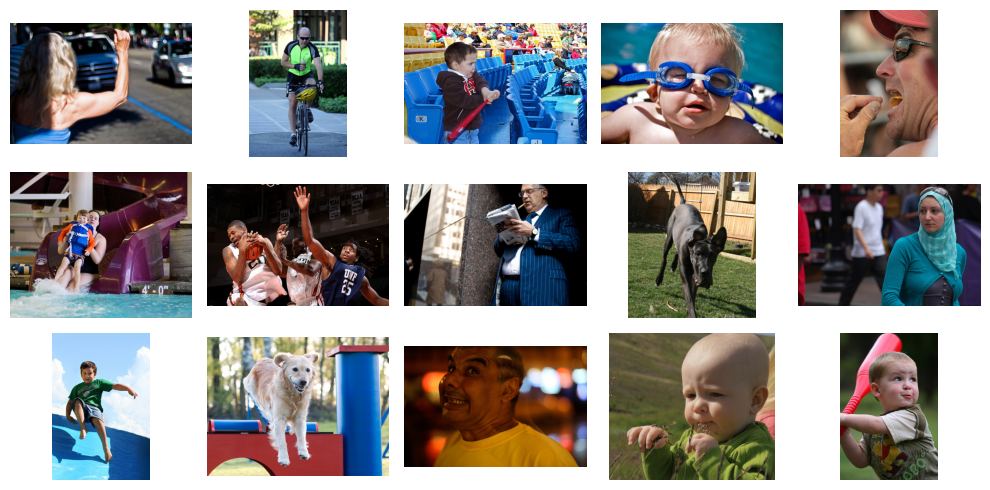

In [ ]:
n_rows = 3
n_cols = 5
to_show = train_dataset['image'].unique()[:n_rows * n_cols]
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5))

for i, img_name in enumerate(to_show):
    img_path = path.join('data', 'train_images', img_name)
    img = Image.open(img_path).convert('RGB')

    row = i // n_cols  # Номер строки
    col = i % n_cols   # Номер столбца

    axes[row, col].imshow(img)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

Как мы видим, присутствуют самые разные изображения.

In [ ]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [ ]:
check_duplicates(train_dataset)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(train_dataset)

Пропусков не обнаружено.


Датасет содержит 5822 записей. Присутствуют 3 колонки: название файла, id запроса и его текст. Датасет не содержит дубликатов или пропусков.

В папке `test_images` содержатся изображения для тестирования модели и данный датасет содержит имена файлов для тестирования.

In [ ]:
test_images = pd.read_csv('./data/test_images.csv')
test_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


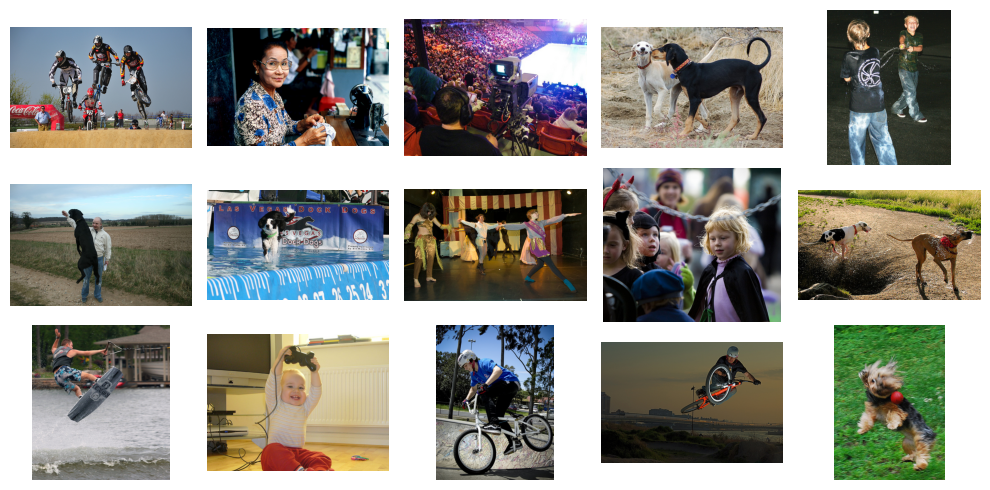

In [ ]:
n_rows = 3
n_cols = 5
to_show = test_images['image'].unique()[:n_rows * n_cols]
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5))

for i, img_name in enumerate(to_show):
    img_path = path.join('data', 'test_images', img_name)
    img = Image.open(img_path).convert('RGB')

    row = i // n_cols  # Номер строки
    col = i % n_cols   # Номер столбца

    axes[row, col].imshow(img)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
test_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


In [ ]:
check_duplicates(test_images)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(test_images)

Пропусков не обнаружено.


Данный датасет содержит всего 100 записей и всего 1 столбец - имя файла с изображением для тестирования. Датасет не содержит полных дубликатов и изображений.

В файле `test_queries.csv` находится информация, необходимая для тестирования:
- идентификатор запроса,
- текст запроса
- релевантное изображение.

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [ ]:
test_queries = pd.read_csv('./data/test_queries.csv', sep='|', index_col=0)
test_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


Посмотрим запросы для первого изображения:

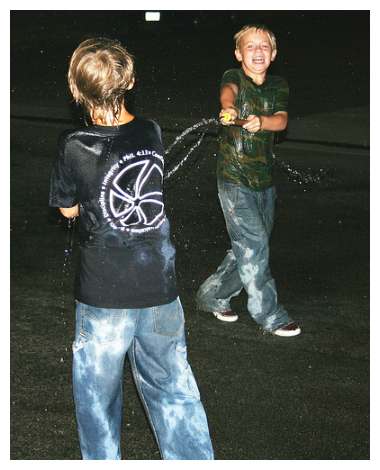

In [ ]:
first_image_name = test_queries.loc[0, 'image']
first_image_path = path.join('data', 'test_images', first_image_name)
first_image = Image.open(first_image_path).convert('RGB')
plt.imshow(first_image)
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
mask = test_queries['image'] == first_image_name
test_queries.loc[mask, 'query_text'].values

array(['Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .',
       'Two boys are squirting water guns at each other .',
       'Two boys spraying each other with water',
       'Two children wearing jeans squirt water at each other .',
       'Two young boys are squirting water at each other .'], dtype=object)

Все запросы примерно похожи и подходят к изображению. Сразу видно, что некоторые запросы должны быть обработаны отдельно, так как отсылаются к детям (и содержат *запрещенные* слова).

In [ ]:
test_queries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 31.8+ KB


In [ ]:
check_duplicates(test_queries)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(test_queries)

Пропусков не обнаружено.


Датасет содержит 500 записей и содержит 3 столбца: id запроса и его текст, а также изображение, к которому происходит это описание.

In [ ]:
np.all(test_queries['query_id'].apply(lambda x: x.split('#')[0]) == test_queries['image'])

True

Все корректно - id запроса соответствует имени файла.

В файле ExpertAnnotations.tsv содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1 - Имя файла изображения.\
2 - Идентификатор описания.\
3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от `1` до `4`, где:\
`1` — изображение и запрос совершенно не соответствуют друг другу\
`2` — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует\
`3` — запрос и текст соответствуют с точностью до некоторых деталей\
`4` — запрос и текст соответствуют полностью

In [ ]:
expert_annotations = pd.read_csv('./data/ExpertAnnotations.tsv', sep='\t', header=None, names=['image', 'query_id', 'annot_1', 'annot_2', 'annot_3'])
expert_annotations.head()

,image,query_id,annot_1,annot_2,annot_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [ ]:
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   annot_1   5822 non-null   int64 
 3   annot_2   5822 non-null   int64 
 4   annot_3   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


In [ ]:
check_duplicates(expert_annotations)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(expert_annotations)

Пропусков не обнаружено.


In [ ]:
expert_annotations['annot_1'].describe()

count    5822.000000
mean        1.436620
std         0.787084
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         4.000000
Name: annot_1, dtype: float64

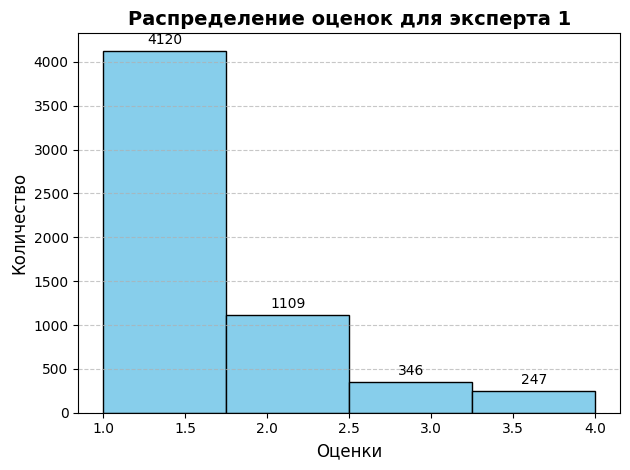

In [ ]:
create_histogram(expert_annotations['annot_1'], 4, 'Распределение оценок для эксперта 1', 'Оценки')

In [ ]:
expert_annotations['annot_2'].describe()

count    5822.000000
mean        1.624356
std         0.856222
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         4.000000
Name: annot_2, dtype: float64

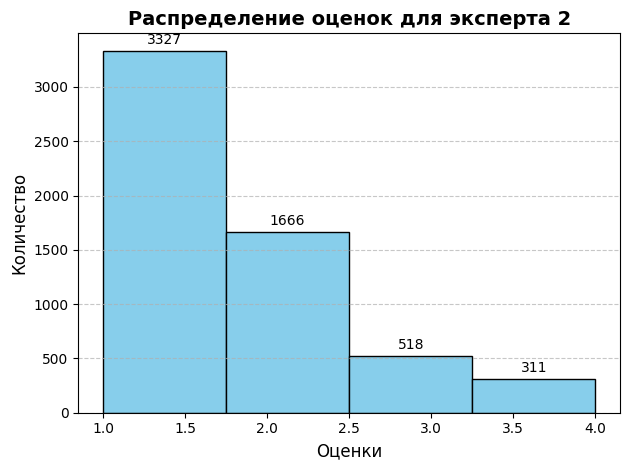

In [ ]:
create_histogram(expert_annotations['annot_2'], 4, 'Распределение оценок для эксперта 2', 'Оценки')

In [ ]:
expert_annotations['annot_3'].describe()

count    5822.000000
mean        1.881999
std         0.904087
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: annot_3, dtype: float64

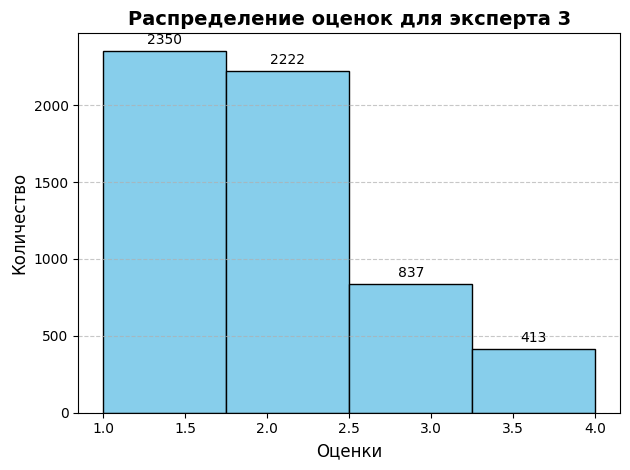

In [ ]:
create_histogram(expert_annotations['annot_3'], 4, 'Распределение оценок для эксперта 3', 'Оценки')

Видно, что эксперты 1 и 2 поставили оценку `1` (полное несоответствие) для бОльшей части изображений-запросов. Эксперт 3 примерно одинаково ставил оценки `1` и `2` (`2350` и `2222` соответственно). Оценки `3` и `4` ставились куда реже всеми тремя экспертами. Можно предположить, что данные для обучения не очень качественные и разработать *Proof of Concept* будет непросто.

Для дальнейшей работы сагрегируем данные:
- Если для одного изображения все оценки среди экспертов различны - усредним их.
- Если же есть равные оценки - применим голосование большинством.

In [ ]:
def agg_expert_annot(row: pd.Series):
    a, b, c = row
    if len(set([a, b, c])) == 3:  # все оценки различны - усредняем
        return (a + b + c) / 3
    else:  # голосуем большинством
        return max([a, b, c], key=lambda x: [a, b, c].count(x))

In [ ]:
expert_annotations['agg_expert_annot'] = expert_annotations[['annot_1', 'annot_2', 'annot_3']].apply(agg_expert_annot, axis=1)
expert_annotations = expert_annotations.drop(columns=['annot_1', 'annot_2', 'annot_3'])
expert_annotations.head()

,image,query_id,agg_expert_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0


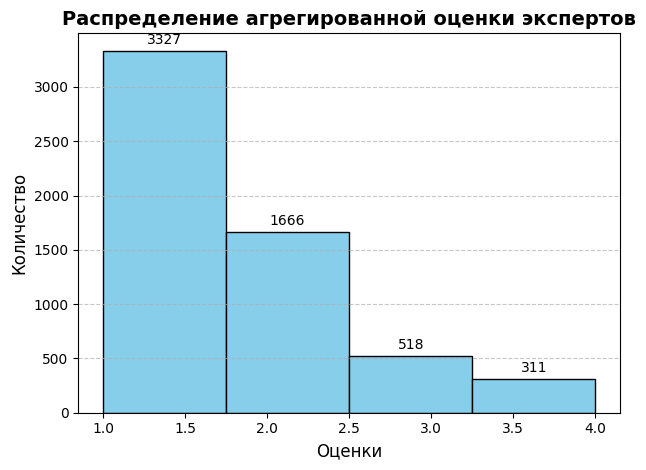

In [ ]:
create_histogram(expert_annotations['agg_expert_annot'],
                 4,
                 'Распределение агрегированной оценки экспертов',
                 'Оценки')

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1) Имя файла изображения.
2) Идентификатор описания.
3) Доля людей, подтвердивших, что описание соответствует изображению.
4) Количество человек, подтвердивших, что описание соответствует изображению.
5) Количество человек, подтвердивших, что описание не соответствует изображению.

In [ ]:
crowd_annotations = pd.read_csv('./data/CrowdAnnotations.tsv',
                                sep='\t',
                                header=None,
                                names=['image', 'query_id', 'pos_part', 'pos_count', 'neg_count'])
crowd_annotations.head()

,image,query_id,pos_part,pos_count,neg_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [ ]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   pos_part   47830 non-null  float64
 3   pos_count  47830 non-null  int64  
 4   neg_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [ ]:
check_duplicates(crowd_annotations)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(crowd_annotations)

Пропусков не обнаружено.


In [ ]:
crowd_annotations['pos_part'].describe()

count    47830.000000
mean         0.068786
std          0.207532
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: pos_part, dtype: float64

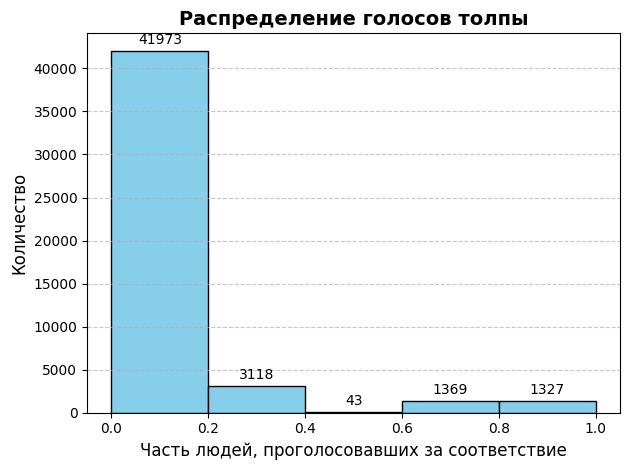

In [ ]:
create_histogram(crowd_annotations['pos_part'],
                 5,
                 'Распределение голосов толпы',
                 'Часть людей, проголосовавших за соответствие')

В данном датасете наблюдается такая же картинка, что и в датасете с голосами экспертов. Подавляющее большинство голосует за то, что описание полностью не соответствует изображению.

In [ ]:
crowd_annotations = crowd_annotations.rename(columns={'pos_part': 'agg_crowd_annot'})

In [ ]:
crowd_annotations = crowd_annotations.drop(columns=['pos_count', 'neg_count'])
crowd_annotations.head()

,image,query_id,agg_crowd_annot
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


In [ ]:
expert_annotations.head()

,image,query_id,agg_expert_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0


In [ ]:
crowd_annotations.head()

,image,query_id,agg_crowd_annot
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


Приведем оценки экспертов к диапазону `[0; 1]`.

In [ ]:
expert_annotations['agg_expert_annot'].min(), expert_annotations['agg_expert_annot'].median(), expert_annotations['agg_expert_annot'].max()

(1.0, 1.0, 4.0)

In [ ]:
expert_annotations['agg_expert_annot'] = (expert_annotations['agg_expert_annot'] - 1) / 3

In [ ]:
expert_annotations['agg_expert_annot'].min(), expert_annotations['agg_expert_annot'].median(), expert_annotations['agg_expert_annot'].max()

(0.0, 0.0, 1.0)

Далее проверим и объеденим оценки "толпы" и экспертов:

In [ ]:
expert_annotations_index = set(expert_annotations['image'] + expert_annotations['query_id'])
crowd_annotations_index = set(crowd_annotations['image'] + crowd_annotations['query_id'])

print(f'Общие оценки: {len(expert_annotations_index & crowd_annotations_index)}')
print(f'Только экспертная оценка: {len(expert_annotations_index - crowd_annotations_index)}')
print(f'Только оценка толпы: {len(crowd_annotations_index - expert_annotations_index)}')

Общие оценки: 2329
Только экспертная оценка: 3493
Только оценка толпы: 45501


In [ ]:
train_dataset_index = set(train_dataset['image'] + train_dataset['query_id'])
print(f'Есть в трейне, но нет экспертных оценок: {len(train_dataset_index - expert_annotations_index)}')
print(f'Есть в трейне, но нет оценок толпы: {len(train_dataset_index - crowd_annotations_index)}')
print('---')
print(f'Есть оценки экспертов, но нет в трейне: {len(expert_annotations_index - train_dataset_index)}')
print(f'Есть оценки толпы, но нет в трейне: {len(crowd_annotations_index - train_dataset_index)}')

Есть в трейне, но нет экспертных оценок: 0
Есть в трейне, но нет оценок толпы: 3493
---
Есть оценки экспертов, но нет в трейне: 0
Есть оценки толпы, но нет в трейне: 45501


In [ ]:
len(crowd_annotations_index)

47830

Как мы видим, встречаются самые разные ситуации. В целом, оценки толпы для нас играют мало роли. Огромная часть оценок толпы не пригодится нам для обучения, так как их нет в `train_dataset`. Поэтому возьмем только те пары, где есть оценки экспертов.

In [ ]:
annotations = pd.merge(expert_annotations, crowd_annotations, how='left', on=['image', 'query_id'])
annotations.head()

,image,query_id,agg_expert_annot,agg_crowd_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,NaN


In [ ]:
annotations['final_annot'] = np.nan  # просто заглушка

Если есть оценка только от экспертов - она и будет финальной оценкой.

In [ ]:
mask = (annotations['agg_expert_annot'].notna()) & (annotations['agg_crowd_annot'].isna())
annotations.loc[mask, 'final_annot'] = annotations.loc[mask, 'agg_expert_annot']

Если есть и те и те оценки - возьмем взвешенное среднее.

In [ ]:
mask = (annotations['agg_expert_annot'].notna()) & (annotations['agg_crowd_annot'].notna())
annotations.loc[mask, 'final_annot'] = annotations.loc[mask, 'agg_crowd_annot'] * 0.4 + annotations.loc[mask, 'agg_expert_annot'] * 0.6

Проверим, что оценка есть для всех записей.

In [ ]:
annotations['final_annot'].isna().sum()

0

In [ ]:
annotations['final_annot'].describe()

count    5822.000000
mean        0.175806
std         0.260018
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: final_annot, dtype: float64

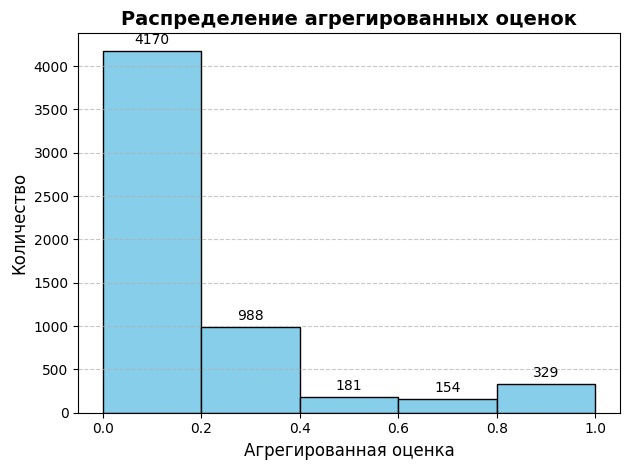

In [ ]:
create_histogram(annotations['final_annot'],
                 5,
                 'Распределение агрегированных оценок',
                 'Агрегированная оценка')

Значения также находятся в диапазоне `[0; 1]`. Распределение сохранилось. Следовательно объединение проведено правильно.

In [ ]:
annotations.head()

,image,query_id,agg_expert_annot,agg_crowd_annot,final_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,NaN,0.000000


In [ ]:
annotations = annotations.drop(columns=['agg_expert_annot', 'agg_crowd_annot'])

In [ ]:
annotations.head()

,image,query_id,final_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000


In [ ]:
del crowd_annotations
del expert_annotations

В данном пункте агрегировали оценки:
- есть есть оценка только экспертов - берется агрегированная оценка экспертов
- если есть оценка только "толпы" - берется агрегированная оценка "толпы"
- если есть обе оценки - они берутся обе с весами 0.6 и 0.4 для оценок экспертов и "толпы" соответственно

В конце оценка была приведена к диапазону `[0; 1]`.

In [ ]:
train_dataset.head(1)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [ ]:
annotations.head(1)

,image,query_id,final_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0


In [ ]:
train_dataset = pd.merge(train_dataset, annotations, how='left', on=['image', 'query_id'])
train_dataset.head()

,image,query_id,query_text,final_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


---

In [ ]:
mask = train_dataset['query_id'].apply(lambda x: x[:-2]) == train_dataset['image']
train_dataset.loc[mask, 'final_annot'].mean()

0.9729957805907173

По структуре `queru_id` содержит в себе название изображения, для которого он написан. Проверка показала, что для каждого запроса изображение есть в датасете и содержит оценку около 1.

In [ ]:
mask.sum()

158

In [ ]:
train_dataset['query_id'].nunique()

977

Итого у нас есть 158 пар, где описание полностью соответствует изображению (так как было сделано для него). И всего у нас есть 977 уникальных текстовых описаний. Значит есть еще 977-158=819 изображений, для которых нет такой пары. Добавим их в датасет, поставив им меру максимальную меру соответствия.

In [ ]:
train_dataset.shape

(5822, 4)

Для удобства заполнения подготовим словарь вида `{query_id: query_text}`

In [ ]:
id_to_text = dict(zip(train_dataset['query_id'], train_dataset['query_text']))

In [ ]:
unique_query_ids = train_dataset['query_id'].unique()

new_pairs = []
cnt = 0
for query_id in unique_query_ids:
    file_name = query_id[:-2]
    mask = (train_dataset['image'] == file_name) & (train_dataset['query_id'] == query_id)
    if not mask.any():
        new_pairs.append({
            'image': file_name,
            'query_id': query_id,
            'query_text': id_to_text[query_id],
            'final_annot': 1
        })

assert len(new_pairs) == 819

In [ ]:
new_pairs_df = pd.DataFrame(new_pairs)
new_pairs_df.head()

,image,query_id,query_text,final_annot
0,3181701312_70a379ab6e.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,1
1,3207358897_bfa61fa3c6.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,1
2,3286822339_5535af6b93.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,1
3,3360930596_1e75164ce6.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,1
4,3545652636_0746537307.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,1


In [ ]:
train_dataset = pd.concat([train_dataset, new_pairs_df], ignore_index=True)
train_dataset.head()

,image,query_id,query_text,final_annot
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.2
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


In [ ]:
train_dataset.shape

(6641, 4)

---

In [ ]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6641 entries, 0 to 6640
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        6641 non-null   object 
 1   query_id     6641 non-null   object 
 2   query_text   6641 non-null   object 
 3   final_annot  6641 non-null   float64
dtypes: float64(1), object(3)
memory usage: 207.7+ KB


In [ ]:
check_duplicates(train_dataset)

Полных дубликатов не обнаружено.


In [ ]:
check_nans(train_dataset)

Пропусков не обнаружено.


Теперь удалим запрещенный контент по условию. Законодательно в некоторых странах запрещен десткий контент, его и будем удалять

In [ ]:
BANNED_WORDS = {
    'child', 'children',       # ребенок, дети
    'baby', 'babies',          # младенец, младенцы
    'kid', 'kids',             # ребенок (разг.), дети
    'boy', 'boys',             # мальчик, мальчики
    'girl', 'girls',           # девочка, девочки
    'toddler', 'toddlers',     # малыш, малыши
    'infant', 'infants',       # младенец, младенцы
    'teen', 'teens',           # подросток, подростки
    'teenager', 'teenagers',   # подросток, подростки
    'youth',                   # молодежь (до 16 лет)
    'youngster', 'youngsters', # юноша, юноши
    'newborn', 'newborns',     # новорожденный, новорожденные
    'preteen', 'preteens',     # до подросткового возраста
}

In [ ]:
@lru_cache(maxsize=None)
def should_be_banned(description: str) -> bool:
    words = set(description.lower().split())
    return len(words & BANNED_WORDS) != 0

In [ ]:
mask = train_dataset['query_text'].apply(should_be_banned)

Проверим описания:

In [ ]:
train_dataset.loc[mask, 'query_text'].unique()[:16]

array(['A young child is wearing blue goggles and sitting in a float in a pool .',
       'A girl wearing a yellow shirt and sunglasses smiles .',
       'A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .',
       'A little boy shakes the snow off of a tree .',
       'The kid is on a float in the snow .',
       'A little girl wearing sunglasses puts her feet into the kitchen sink .',
       'A young boy in a swimming suit sits in water .',
       'A child is preparing to slide down a piece of playground equipment .',
       'The baby in suspenders sits by a toy .',
       'A man and young girl eat a meal on a city street .',
       'A young boy kicks a soccer ball while six others play but are dressed as referee .',
       'A little girl with mud on her face cries .',
       'Two little girls dance on a hardwood floor in the house .',
       'Two little children and one is playing with a slinky .',
       'Little gi

In [ ]:
images_to_drop = train_dataset.loc[mask, 'query_id'].apply(lambda x: x[:-2]).unique().tolist()

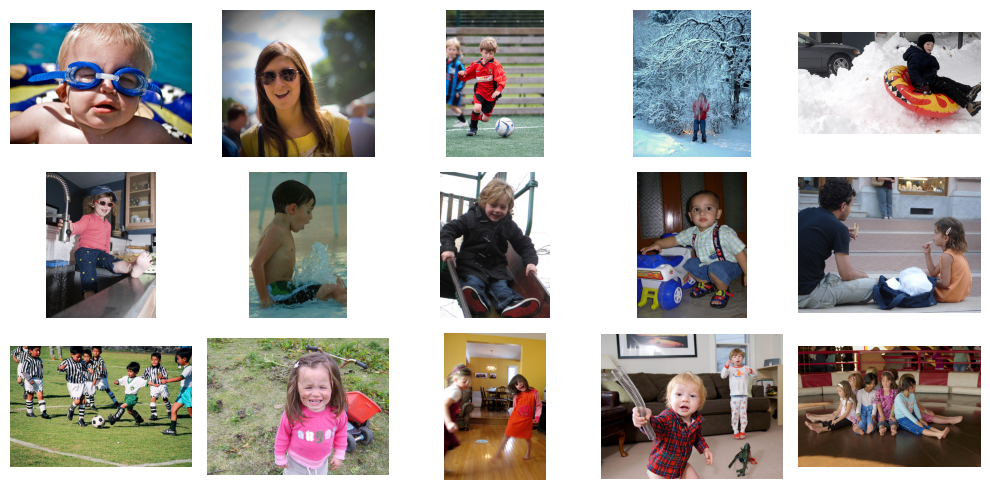

In [ ]:
n_rows = 3
n_cols = 5
to_show = images_to_drop[:n_rows * n_cols]
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5))

for i, img_name in enumerate(to_show):
    img_path = path.join('data', 'train_images', img_name)
    img = Image.open(img_path).convert('RGB')

    row = i // n_cols  # Номер строки
    col = i % n_cols   # Номер столбца

    axes[row, col].imshow(img)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
mask = train_dataset['image'].isin(images_to_drop)
print(f'BEFORE: {len(train_dataset)}')
train_dataset = train_dataset[~mask]
print(f'AFTER: {len(train_dataset)}')

BEFORE: 6641
AFTER: 4644


In [ ]:
train_dataset = train_dataset.drop(columns='query_id').reset_index(drop=True)
train_dataset.head()

,image,query_text,final_annot
0,1056338697_4f7d7ce270.jpg,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,A young child is wearing blue goggles and sitt...,0.0
2,2621415349_ef1a7e73be.jpg,A young child is wearing blue goggles and sitt...,0.0
3,3155451946_c0862c70cb.jpg,A young child is wearing blue goggles and sitt...,0.0
4,3222041930_f642f49d28.jpg,A young child is wearing blue goggles and sitt...,0.0


Сделаем векторизацию текста

In [ ]:
model_name = 'all-MiniLM-L6-v2'

In [ ]:
nlp_model = SentenceTransformer(model_name)

In [ ]:
def vectorize_text(texts, model, batch_size=32):
    """
    Векторизация текстов с использованием модели SentenceTransformer и пулинга.

    Args:
        texts (list): Список текстов для векторизации.
        model (SentenceTransformer): Модель для генерации эмбеддингов.
        batch_size (int): Размер пакета для обработки.

    Returns:
        torch.Tensor: Тензор эмбеддингов текстов.
    """
    embeddings = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Vectorizing texts"):
        batch_texts = texts[i:i + batch_size]

        # Генерация эмбеддингов для пакета текстов
        batch_embeddings = model.encode(
            batch_texts,
            batch_size=batch_size,
            show_progress_bar=False,  # Отключаем прогресс-бар внутри encode
            convert_to_tensor=True    # Возвращаем результат как тензор PyTorch
        )
        embeddings.append(batch_embeddings)

    # Объединяем все эмбеддинги в один тензор
    embeddings = torch.cat(embeddings, dim=0)
    return embeddings

In [ ]:
texts = train_dataset['query_text'].tolist()

embeddings = vectorize_text(texts, nlp_model)

Vectorizing texts:   0%|          | 0/146 [00:00<?, ?it/s]

Добавим эмбеддинги обратно в датафрейм.

In [ ]:
embeddings_df = pd.DataFrame(embeddings.cpu().numpy(), columns=[f'text_embedding_{i}' for i in range(embeddings.shape[1])])

train_dataset = pd.concat([train_dataset, embeddings_df], axis=1)
train_dataset = train_dataset.drop(columns='query_text')

In [ ]:
train_dataset.head()

,image,final_annot,text_embedding_0,text_embedding_1,text_embedding_2,text_embedding_3,text_embedding_4,text_embedding_5,text_embedding_6,text_embedding_7,...,text_embedding_374,text_embedding_375,text_embedding_376,text_embedding_377,text_embedding_378,text_embedding_379,text_embedding_380,text_embedding_381,text_embedding_382,text_embedding_383
0,1056338697_4f7d7ce270.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.088913,0.037273,0.051372,-0.093594,-0.069748,0.094353,-0.069782,0.072154,0.001959,0.075876
1,1262583859_653f1469a9.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.088913,0.037273,0.051372,-0.093594,-0.069748,0.094353,-0.069782,0.072154,0.001959,0.075876
2,2621415349_ef1a7e73be.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.088913,0.037273,0.051372,-0.093594,-0.069748,0.094353,-0.069782,0.072154,0.001959,0.075876
3,3155451946_c0862c70cb.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.088913,0.037273,0.051372,-0.093594,-0.069748,0.094353,-0.069782,0.072154,0.001959,0.075876
4,3222041930_f642f49d28.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.088913,0.037273,0.051372,-0.093594,-0.069748,0.094353,-0.069782,0.072154,0.001959,0.075876


В результате, с помощью `all-MiniLM-L6-v2` мы получили векторые представления текстов размерность `(количество записей, 384)`.

Сделаем модель для обработки изображений

In [ ]:
resnet18 = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

Удалим последний слой классификации:

In [ ]:
resnet18 = torch.nn.Sequential(*list(resnet18.children())[:-1])  # Убираем последний полносвязный слой

In [ ]:
resnet18.eval();  # Переводим модель в режим оценки

In [ ]:
if torch.cuda.is_available():
    print(colored('GPU найден.', 'green'))
    device = torch.device('cuda')
else:
    print(colored('GPU не найден. Будет использован CPU.', 'red'))
    device = torch.device('cpu')

resnet18.to(device);

GPU не найден. Будет использован CPU.


Эмбеддинги

In [ ]:
@lru_cache(maxsize=None)
def preprocess_image(img_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img)
    img_tensor = img_tensor.unsqueeze(0)
    return img_tensor

In [ ]:
def get_image_embeddings(image_paths, model, device):
    embeddings = []
    for img_path in tqdm(image_paths, desc="Processing images"):
        img_tensor = preprocess_image(img_path)
        img_tensor = img_tensor.to(device)

        with torch.no_grad():
            embedding = model(img_tensor)

        # Преобразуем в одномерный вектор
        embedding = embedding.squeeze().cpu().numpy()
        embeddings.append(embedding)

    return np.array(embeddings)

In [ ]:
image_paths = (path.join('data', 'train_images', str(img_path)) for img_path in train_dataset['image'])
image_embeddings = get_image_embeddings(image_paths, resnet18, device)

Processing images: 0it [00:00, ?it/s]

In [ ]:
image_embeddings_df = pd.DataFrame(image_embeddings, columns=[f'image_embedding_{i}' for i in range(image_embeddings.shape[1])])
train_dataset = pd.concat([train_dataset, image_embeddings_df], axis=1).reset_index(drop=True)

В результате, с помощью ResNet18 мы получили векторные представления изображений с размерностью `(количество изображений, 512)`.

# 3 - Models

In [ ]:
train_dataset.head()

,image,final_annot,text_embedding_0,text_embedding_1,text_embedding_2,text_embedding_3,text_embedding_4,text_embedding_5,text_embedding_6,text_embedding_7,...,image_embedding_502,image_embedding_503,image_embedding_504,image_embedding_505,image_embedding_506,image_embedding_507,image_embedding_508,image_embedding_509,image_embedding_510,image_embedding_511
0,1056338697_4f7d7ce270.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.637314,0.219069,0.384110,1.079248,1.404971,0.688913,1.954878,0.161944,0.782140,0.064406
1,1262583859_653f1469a9.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.256123,0.382986,0.767397,0.958279,0.767115,1.413141,0.572110,0.650180,0.094199,1.365294
2,2621415349_ef1a7e73be.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.895655,0.469738,1.316282,1.893027,4.764876,0.763957,0.519451,1.884193,0.679976,1.014401
3,3155451946_c0862c70cb.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.347750,1.025349,2.216003,0.370978,0.945540,1.724207,0.789453,3.455815,3.262314,1.381282
4,3222041930_f642f49d28.jpg,0.0,-0.026165,-0.020042,0.020325,-0.01057,0.05226,0.017089,0.18148,0.046154,...,0.840910,1.082685,1.600406,0.373154,1.917665,0.534464,1.782730,1.351781,1.741965,0.824692


In [ ]:
target = 'final_annot'
groups = train_dataset['image']
X = train_dataset.drop(columns=[target, 'image'])
y = train_dataset[target]

In [ ]:
gss = GroupShuffleSplit(1, test_size=TEST_SIZE, random_state=RANDOM_STATE)
train_indexes, valid_indexes = next(gss.split(X, y, groups))

X_train, X_valid = X.loc[train_indexes], X.loc[valid_indexes]
y_train, y_valid = y.loc[train_indexes], y.loc[valid_indexes]

В качестве метрики будем использовать MAE, чтобы минимизировать ошибку на всех уровнях таргета.

Функции для подговтоки данных

In [ ]:
def get_objective(estimator,
                  X_train: pd.DataFrame,
                  y_train: pd.Series,
                  X_valid: pd.DataFrame,
                  y_valid: pd.Series):
    def objective(params: dict) -> float:
        # Некоторые параметры могут быть только целочисленные, приводим их к нужному типу
        for key, value in params.items():
            if isinstance(value, float) and value % 1 == 0:
                params[key] = int(value)

        estimator.set_params(**params)


        try:
            estimator.fit(X_train, y_train)
            y_valid_pred = estimator.predict(X_valid)
            valid_mae = mean_absolute_error(y_valid, y_valid_pred)

            return {
                'loss': valid_mae,
                'params': params,
                'status': STATUS_OK
            }
        except Exception:
            return {'status': STATUS_FAIL}

    return objective

In [ ]:
def get_model_results(estimator,
                      param_space: dict,
                      X_train: pd.DataFrame,
                      y_train: pd.Series,
                      X_valid: pd.DataFrame,
                      y_valid: pd.Series,
                      max_evals: int = 100
                      ) -> tuple[dict, float]:
    objective = get_objective(estimator, X_train, y_train, X_valid, y_valid)
    trials = Trials()

    fmin(
        fn=objective,
        space=param_space,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials,
        rstate=np.random.default_rng(RANDOM_STATE),
        show_progressbar=True
    )

    clear_output()

    best_params = trials.best_trial['result']['params']
    best_score = abs(trials.best_trial['result']['loss'])
    print(f'Finish with best MAE = {best_score:.4f}')

    return best_params, best_score

DummyRegressor

In [ ]:
dummy = DummyRegressor()
_, best_score_dummy = get_model_results(dummy, {'strategy': 'mean'}, X_train, y_train, X_valid, y_valid, 1)

Finish with best MAE = 0.2968


LinearRegression

In [ ]:
lr = LinearRegression();

In [ ]:
best_params_lr, best_score_lr = get_model_results(lr, {'positive': False}, X_train, y_train, X_valid, y_valid, 1)

Finish with best MAE = 0.4599


Модель справилась хуже DummyRegressor'а.

Ridge

In [ ]:
ridge = Ridge(random_state=RANDOM_STATE);

In [ ]:
param_space = {
    'alpha': hp.loguniform('alpha', -5, 2),  # Логарифмическое распределение для alpha
    'fit_intercept': hp.choice('fit_intercept', [True, False]),  # Флаг использования свободного члена
    'solver': hp.choice('solver', ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']),  # Метод решения
    'max_iter': hp.quniform('max_iter', 100, 5000, 1),  # Максимальное число итераций (целое число)
    'tol': hp.loguniform('tol', -8, -2),  # Допустимая погрешность для остановки
}

In [ ]:
best_params_ridge, best_score_ridge = get_model_results(ridge, param_space, X_train, y_train, X_valid, y_valid, 100)

Finish with best MAE = 0.2934


In [ ]:
best_params_ridge

{'alpha': 1.0473752806972259,
 'fit_intercept': True,
 'max_iter': 3002,
 'solver': 'lsqr',
 'tol': 0.1018537803828977}

In [ ]:
best_score_ridge

0.29340140334026843

SVR

In [ ]:
svr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearSVR(random_state=RANDOM_STATE))
])

In [ ]:
param_space = {
    'model__C': hp.loguniform('model__C', -2, 3),  # Параметр регуляризации
    'model__epsilon': hp.uniform('model__epsilon', 0.01, 0.2),  # Зона допустимой ошибки
    'model__loss': hp.choice('model__loss', ['epsilon_insensitive', 'squared_epsilon_insensitive']),  # Функция потерь
    'model__dual': hp.choice('model__dual', [True, False]),  # Двойственная или прямая задача
    'model__tol': hp.loguniform('model__tol', -8, -2),  # Допустимая погрешность для остановки
    'model__fit_intercept': hp.choice('model__fit_intercept', [True, False]),  # Флаг использования свободного члена
    'model__max_iter': hp.quniform('model__max_iter', 500, 5000, 1),  # Максимальное число итераций
}

In [ ]:
best_params_svr, best_score_svr = get_model_results(svr_pipeline, param_space, X_train, y_train, X_valid, y_valid, 100)

Finish with best MAE = 0.3053


In [ ]:
best_params_svr

{'model__C': 3.698239142069974,
 'model__dual': False,
 'model__epsilon': 0.04073322146813248,
 'model__fit_intercept': True,
 'model__loss': 'squared_epsilon_insensitive',
 'model__max_iter': 4455,
 'model__tol': 0.11804474284213512}

In [ ]:
best_score_svr

0.3053190836208012

RandomForestRegressor

In [ ]:
rfr = RandomForestRegressor(random_state=RANDOM_STATE)

In [ ]:
param_space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 1),  # Количество деревьев
    'max_depth': hp.choice('max_depth', [None, hp.quniform('max_depth_int', 5, 30, 1)]),  # Максимальная глубина дерева
    'min_samples_split': hp.uniform('min_samples_split', 0.01, 1.0),  # Минимальное количество объектов для разделения
    'min_samples_leaf': hp.uniform('min_samples_leaf', 0.01, 0.5),  # Минимальное количество объектов в листе
    'max_features': hp.choice('max_features', ['auto', 'sqrt', 'log2']),  # Количество признаков для выбора разбиения
    'bootstrap': hp.choice('bootstrap', [True, False]),  # Использование бутстрэпа
    'criterion': hp.choice('criterion', ['squared_error', 'absolute_error']),  # Функция потерь
}

In [ ]:
best_params_rfr, best_score_rfr = get_model_results(rfr, param_space, X_train, y_train, X_valid, y_valid, 100)

Finish with best MAE = 0.2581


In [ ]:
best_params_rfr

{'bootstrap': False,
 'criterion': 'absolute_error',
 'max_depth': 27,
 'max_features': 'sqrt',
 'min_samples_leaf': 0.024784113564611715,
 'min_samples_split': 0.027741203606603298,
 'n_estimators': 193}

In [ ]:
best_score_rfr

0.25809116905914664

LGBMRegressor

In [ ]:
lgmbr = LGBMRegressor(random_state=RANDOM_STATE, verbose=-1)

In [ ]:
param_space = {
    'n_estimators': hp.quniform('n_estimators', 50, 500, 1),
    'learning_rate': hp.loguniform('learning_rate', -3, 0),
    'max_depth': hp.choice('max_depth', [None, hp.quniform('max_depth_int', 3, 15, 1)]),
    'num_leaves': hp.quniform('num_leaves', 20, 100, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
    'reg_alpha': hp.loguniform('reg_alpha', -5, 2),
    'reg_lambda': hp.loguniform('reg_lambda', -5, 2),
    'min_child_samples': hp.quniform('min_child_samples', 5, 50, 1),
}

In [ ]:
best_params_lgbm, best_score_lgbm = get_model_results(lgmbr, param_space, X_train, y_train, X_valid, y_valid, 50)

Finish with best MAE = 0.2656


In [ ]:
best_params_lgbm

{'colsample_bytree': 0.6563664738378724,
 'learning_rate': 0.1518155651238517,
 'max_depth': 12,
 'min_child_samples': 45,
 'n_estimators': 407,
 'num_leaves': 21,
 'reg_alpha': 2.1849568123366274,
 'reg_lambda': 0.018570520715459834,
 'subsample': 0.5292086099030627}

In [ ]:
best_score_lgbm

0.26564946820759183

Нейросеть

In [ ]:
class TextImageDataset(Dataset):
    def __init__(self,
                 text_embeddings: np.ndarray | torch.Tensor,
                 image_embeddings: np.ndarray | torch.Tensor,
                 labels: np.ndarray | torch.Tensor
                 ) -> None:
        self.text_embeddings = torch.tensor(text_embeddings, dtype=torch.float32)
        self.image_embeddings = torch.tensor(image_embeddings, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.float32)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return (
            self.text_embeddings[idx],
            self.image_embeddings[idx],
            self.labels[idx]
        )

In [ ]:
class EarlyStopping:
    """Класс для реализации ранней остановки."""
    def __init__(self, patience: int = 10, verbose: bool = False):
        """
        Args:
            patience (int): Количество эпох без улучшений перед остановкой.
            verbose (bool): Печатать ли сообщения об остановке.
        """
        self.patience = patience
        self.verbose = verbose
        self.counter: int = 0
        self.best_score: float = None
        self.early_stop: bool = False

    def __call__(self, val_metric):
        score = -val_metric

        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score:
            self.counter += 1
            if self.verbose:
                print(f"EarlyStopping counter: {self.counter}/{self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0


In [ ]:
class TextImageMatchingModel(nn.Module):
    def __init__(self,
                 text_embedding_dim: int = 384,
                 image_embedding_dim: int = 512,
                 hidden_dim: int = 512):
        super(TextImageMatchingModel, self).__init__()

        self.text_fc = nn.Sequential(
            nn.Linear(text_embedding_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2)
        )

        self.image_fc = nn.Sequential(
            nn.Linear(image_embedding_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout()
        )

        self.combined_fc = nn.Sequential(
            nn.Linear(hidden_dim * 2, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, text_embeddings, image_embeddings):
        text_features = self.text_fc(text_embeddings)
        image_features = self.image_fc(image_embeddings)

        combined_features = torch.cat((text_features, image_features), dim=1)

        output = self.combined_fc(combined_features)
        return output.squeeze(-1)

In [ ]:
def evaluate_model(model, dataloader, device):
    model.to(device)
    model.eval()

    total_mae = 0.0
    total_samples = 0

    with torch.no_grad():
        for text_embeddings, image_embeddings, labels in dataloader:
            text_embeddings, image_embeddings, labels = (
                text_embeddings.to(device),
                image_embeddings.to(device),
                labels.to(device)
            )

            predictions = model(text_embeddings, image_embeddings)

            absolute_error = torch.abs(predictions - labels)
            total_mae += absolute_error.sum().item()
            total_samples += labels.size(0)

    mae = total_mae / total_samples
    return mae

In [ ]:
def train_model_with_validation(model,
                                train_loader,
                                valid_loader,
                                criterion,
                                optimizer,
                                num_epochs=10,
                                device='cpu',
                                display_step=5,
                                early_stopping_patience=10):
    model.to(device)
    model.train()

    early_stopping = EarlyStopping(patience=early_stopping_patience)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        total_train_mae = 0.0
        total_train_samples = 0

        for text_embeddings, image_embeddings, labels in train_loader:
            text_embeddings, image_embeddings, labels = (
                text_embeddings.to(device),
                image_embeddings.to(device),
                labels.to(device)
            )

            optimizer.zero_grad()
            outputs = model(text_embeddings, image_embeddings)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            absolute_error = torch.abs(outputs - labels)
            total_train_mae += absolute_error.sum().item()
            total_train_samples += labels.size(0)

        avg_train_loss = running_loss / len(train_loader)
        train_mae = total_train_mae / total_train_samples

        model.eval()
        val_mae = evaluate_model(model, valid_loader, device)

        if (epoch + 1) % display_step == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], "
                  f"Train Loss: {avg_train_loss:.4f}, "
                  f"Train MAE: {train_mae:.4f}, "
                  f"Valid MAE: {val_mae:.4f}")

        # проверка ранней остановки
        early_stopping(val_mae)
        if early_stopping.early_stop:
            print("Ранняя остановка: валидационная метрика не улучшается.")
            print('Финальные результаты:')
            print(f"Epoch [{epoch+1}/{num_epochs}], "
                  f"Train Loss: {avg_train_loss:.4f}, "
                  f"Train MAE: {train_mae:.4f}, "
                  f"Valid MAE: {val_mae:.4f}")
            break

In [ ]:
train_text_embeddings, valid_text_embeddings = embeddings[train_indexes], embeddings[valid_indexes]
train_image_embeddings, valid_image_embeddings = image_embeddings[train_indexes], image_embeddings[valid_indexes]
train_labels, valid_labels = y[train_indexes].to_numpy(), y[valid_indexes].to_numpy()

In [ ]:
train_dataset = TextImageDataset(train_text_embeddings, train_image_embeddings, train_labels)
valid_dataset = TextImageDataset(valid_text_embeddings, valid_image_embeddings, valid_labels)

/var/folders/69/8jw28qm13dd7b1262y17zls00000gn/T/ipykernel_43785/3652917154.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.text_embeddings = torch.tensor(text_embeddings, dtype=torch.float32)


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)

In [ ]:
model = TextImageMatchingModel()
criterion = nn.MSELoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

In [ ]:
if torch.cuda.is_available():
    print(colored('GPU найден.', 'green'))
    device = torch.device('cuda')
else:
    print(colored('GPU не найден. Будет использован CPU.', 'red'))
    device = torch.device('cpu')

GPU не найден. Будет использован CPU.


In [ ]:
train_model_with_validation(
    model=model,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    num_epochs=500,
    device=device,
    display_step=5,
    early_stopping_patience=100
)

Epoch [5/500], Train Loss: 0.1082, Train MAE: 0.2556, Valid MAE: 0.2593
Epoch [10/500], Train Loss: 0.0913, Train MAE: 0.2290, Valid MAE: 0.2617
Epoch [15/500], Train Loss: 0.0810, Train MAE: 0.2083, Valid MAE: 0.2777
Epoch [20/500], Train Loss: 0.0734, Train MAE: 0.1961, Valid MAE: 0.2739
Epoch [25/500], Train Loss: 0.0660, Train MAE: 0.1825, Valid MAE: 0.2722
Epoch [30/500], Train Loss: 0.0619, Train MAE: 0.1740, Valid MAE: 0.2710
Epoch [35/500], Train Loss: 0.0547, Train MAE: 0.1598, Valid MAE: 0.2803
Epoch [40/500], Train Loss: 0.0494, Train MAE: 0.1502, Valid MAE: 0.2848
Epoch [45/500], Train Loss: 0.0464, Train MAE: 0.1436, Valid MAE: 0.2801
Epoch [50/500], Train Loss: 0.0457, Train MAE: 0.1409, Valid MAE: 0.2792
Epoch [55/500], Train Loss: 0.0424, Train MAE: 0.1355, Valid MAE: 0.2946
Epoch [60/500], Train Loss: 0.0388, Train MAE: 0.1282, Valid MAE: 0.2862
Epoch [65/500], Train Loss: 0.0377, Train MAE: 0.1262, Valid MAE: 0.2868
Epoch [70/500], Train Loss: 0.0395, Train MAE: 0.127

In [ ]:
nn_mae = evaluate_model(model, valid_loader, device=device)
print(f"MAE on validation = {nn_mae:.4f}")

MAE on validation = 0.2953


# 4 - Results

In [ ]:
pd.options.display.float_format = '{:.4f}'.format

pd.DataFrame(
    data=[best_score_lr, best_score_ridge, best_score_svr, best_score_rfr, best_score_lgbm, nn_mae, best_score_dummy],
    index=['LinearRegression', 'Ridge', 'SVR', 'RandomForestRegressor', 'LGBMRegressor', 'FC NN', 'DummyRegressor'],
    columns=['mae']
).sort_values('mae', ascending=True)

,mae
RandomForestRegressor,0.2581
LGBMRegressor,0.2656
Ridge,0.2934
FC NN,0.2953
DummyRegressor,0.2968
SVR,0.3053
LinearRegression,0.4599


Почти все модели показали неплохой результат. *LinearRegression* выдает предсказания хуже *DummyRegressor*'а, что скорее всего связано с переобучением.

Лучше всего себя показали 2 модели: *RandomForestRegressor* и *LGBMRegressor*. С минимальным отрывом побеждает первая, однако *LGBM* показывает более высокую скорость обучения и предсказания, поэтому далее будет использован именно она.

In [ ]:
best_model = LGBMRegressor(random_state=RANDOM_STATE, verbose=-1)
best_model.set_params(**best_params_lgbm)
best_model.fit(X_train, y_train);

In [ ]:
test_texts = test_queries['query_text'].to_list()
text_embeddings = vectorize_text(test_texts, nlp_model)

embeddings_df = pd.DataFrame(text_embeddings.cpu().numpy(), columns=[f'text_embedding_{i}' for i in range(embeddings.shape[1])])

Vectorizing texts:   0%|          | 0/16 [00:00<?, ?it/s]

In [ ]:
image_paths = [path.join('data', 'test_images', str(img_path)) for img_path in test_queries['image']]
image_embeddings = get_image_embeddings(image_paths, resnet18, device)

image_embeddings_df = pd.DataFrame(image_embeddings, columns=[f'image_embedding_{i}' for i in range(image_embeddings.shape[1])])
test_dataset = pd.concat([embeddings_df, image_embeddings_df], axis=1).reset_index(drop=True)

Processing images:   0%|          | 0/500 [00:00<?, ?it/s]

---

In [ ]:
def compute_similarity_with_model(text_embedding: np.ndarray,
                                  image_embeddings: np.ndarray,
                                  image_paths: list[str],
                                  model: LGBMRegressor
                                  ) -> tuple[str, float]:

    if len(image_embeddings) != len(image_paths):
        raise ValueError("Количество эмбеддингов картинок должно совпадать с количеством путей к изображениям.")

    if not isinstance(text_embedding, np.ndarray):
        text_embedding = text_embedding.cpu().numpy()
    if not isinstance(image_embeddings, np.ndarray):
        image_embeddings = image_embeddings.cpu().numpy()

    data = []
    for img_emb in image_embeddings:
        combined_embedding = np.concatenate([text_embedding, img_emb])
        data.append(combined_embedding)

    df = pd.DataFrame(data)

    similarity_scores = model.predict(df)

    best_index = similarity_scores.argmax()
    best_image_path = image_paths[best_index]
    best_similarity_score = float(similarity_scores[best_index])

    return best_image_path, best_similarity_score


In [ ]:
best_matches = {}

In [ ]:
to_test = [(idx, t) for idx, t in enumerate(test_texts) if not should_be_banned(t)]
to_test = random.choices(to_test, k=10)

In [ ]:
for idx, desc in to_test:
    text_embedding = text_embeddings[idx]

    best_image_path, best_similarity_score = compute_similarity_with_model(text_embedding, image_embeddings, image_paths, best_model)

    best_matches[desc] = {
        "image_path": best_image_path,
        "similarity_score": best_similarity_score
    }

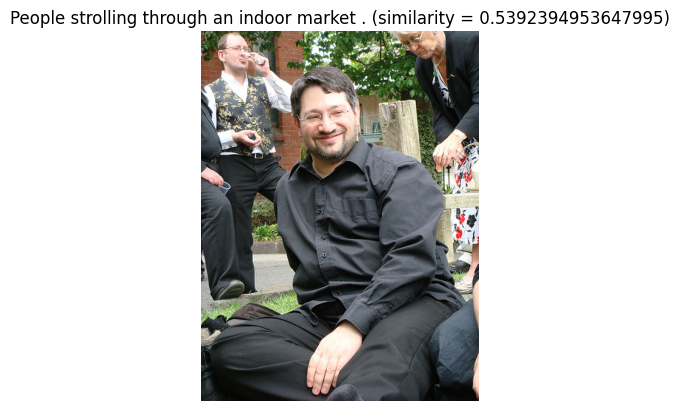

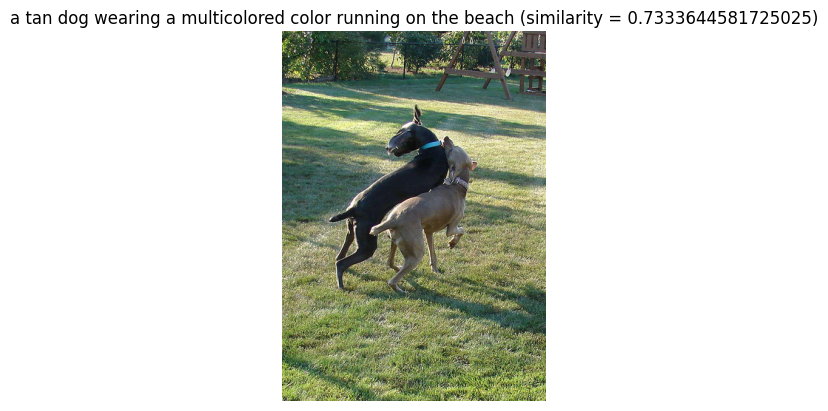

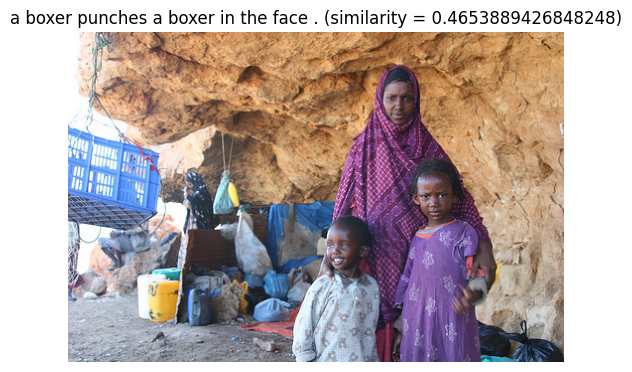

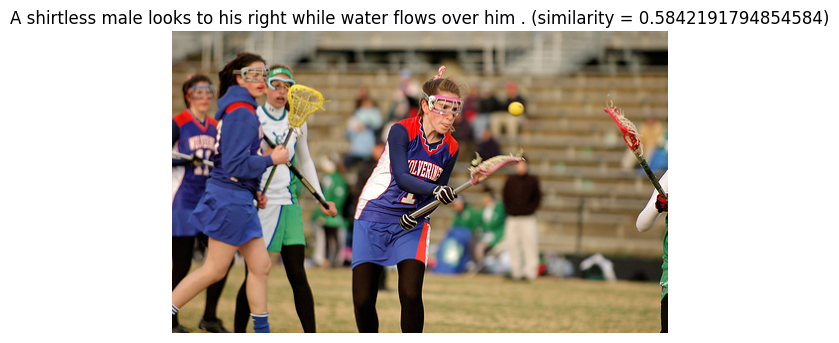

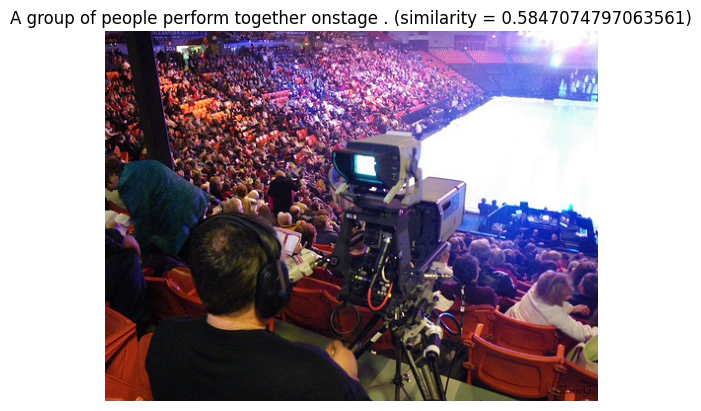

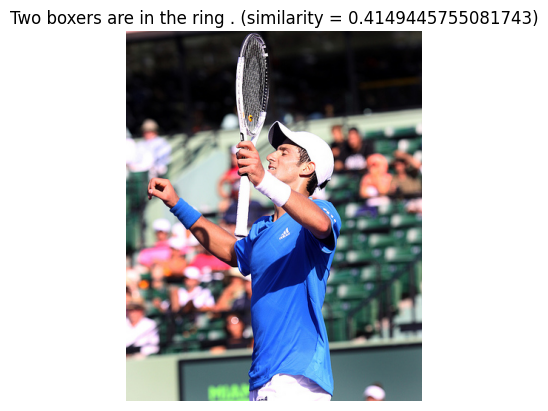

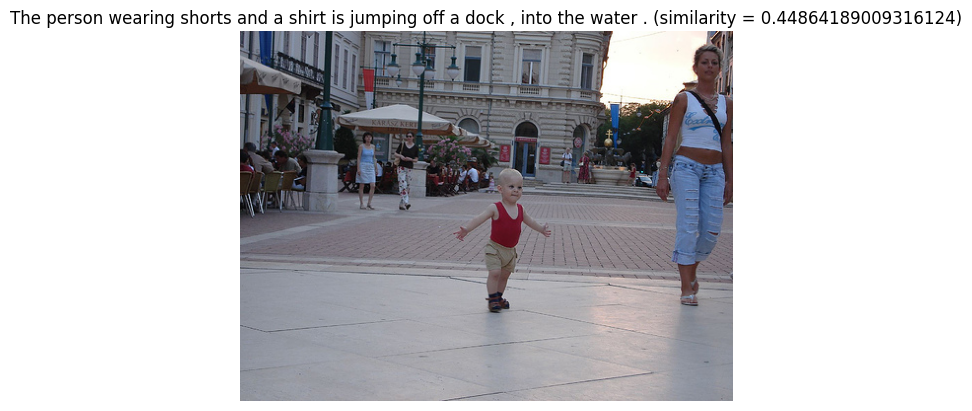

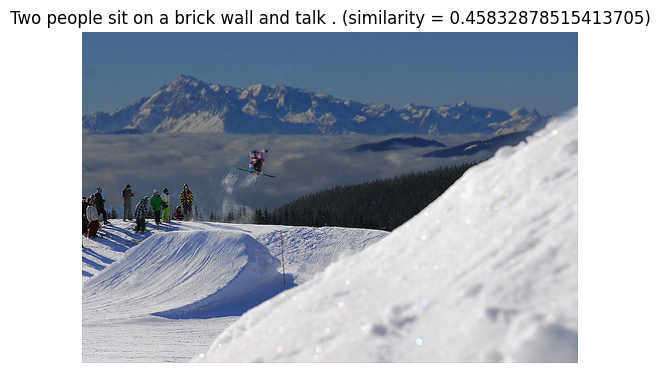

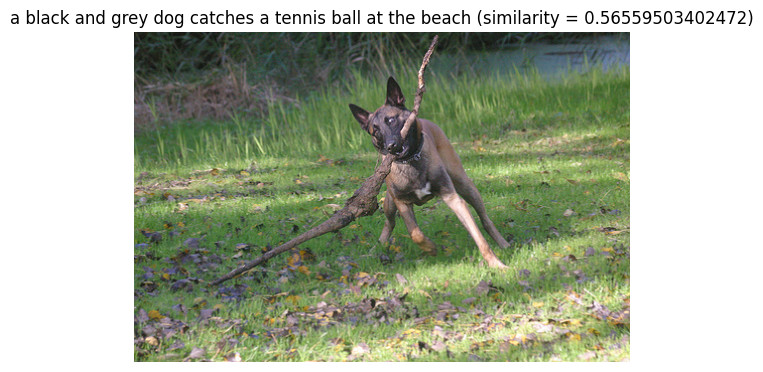

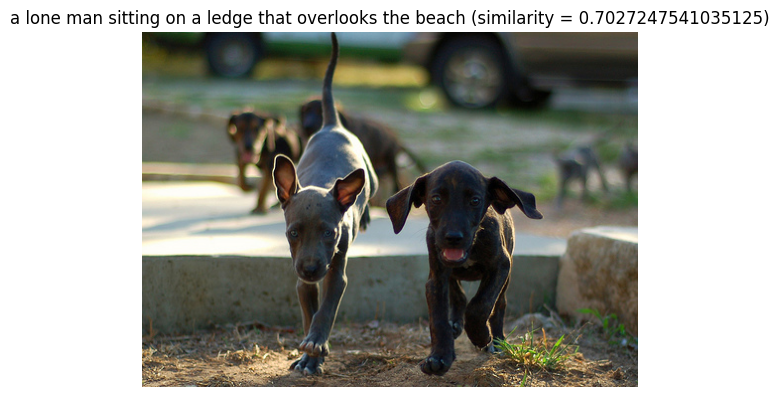

In [ ]:
for text, match in best_matches.items():
    plt.imshow(Image.open(match['image_path']).convert('RGB'))
    sim = match['similarity_score']
    plt.title(f'{text} (similarity = {sim})')
    plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.show()

На данном этапе мы видим, что результаты модели крайне неудовлетворительные. Визуально кажется, что модель выдает случайные картинки, так как часто нет вообще никакого сходства.

*P.S. здесь запросы про детей не исключались, так как это внутренний тест для оценки работоспособности в целом.*

PoC проверка

In [ ]:
def get_image(desc: str) -> None:
    if should_be_banned(desc):
        print(DISCLAIMER)
        return

    text_embedding = vectorize_text([desc], nlp_model).flatten()
    best_image_path, best_similarity = compute_similarity_with_model(text_embedding, image_embeddings, image_paths, best_model)

    plt.imshow(Image.open(best_image_path).convert('RGB'))
    plt.title(f'{desc} (similarity = {best_similarity})')
    plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.show()

---

Для начала проверим, как наша функция блокирует запрещенный контент.

In [ ]:
get_image('young child play with ball')

This image is unavailable in your country in compliance with local laws.


Теперь посмотрим, что функция вернет для *разрешенных* запросов.

Vectorizing texts:   0%|          | 0/1 [00:00<?, ?it/s]

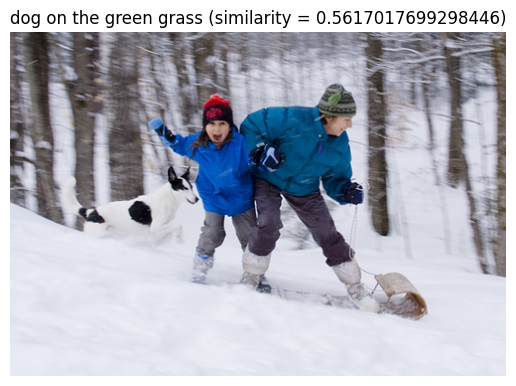

In [ ]:
get_image('dog on the green grass')

Vectorizing texts:   0%|          | 0/1 [00:00<?, ?it/s]

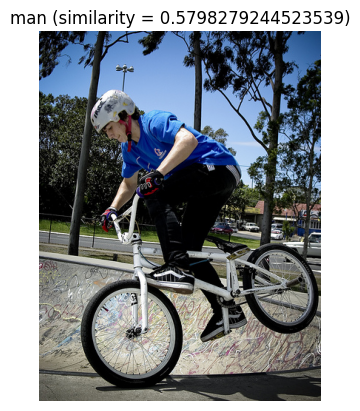

In [ ]:
get_image('man')

Vectorizing texts:   0%|          | 0/1 [00:00<?, ?it/s]

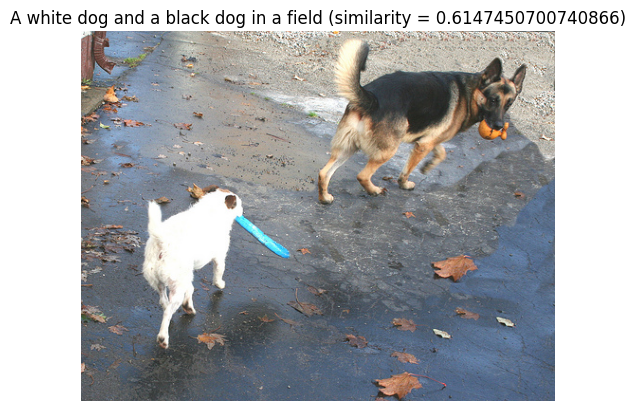

In [ ]:
get_image('A white dog and a black dog in a field')

Vectorizing texts:   0%|          | 0/1 [00:00<?, ?it/s]

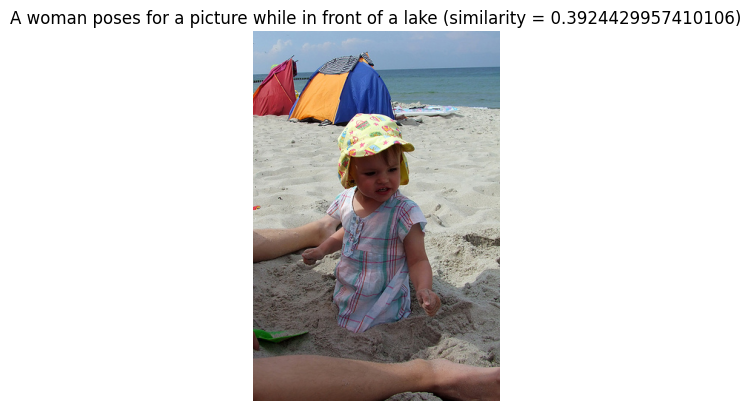

In [ ]:
get_image('A woman poses for a picture while in front of a lake')

Модель абсолютно не справляется со своей задачей.

Тестируем также предобученную модель CLIP от openai

In [ ]:
model_name = "openai/clip-vit-base-patch32"
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

In [ ]:
# Получение эмбеддингов для всех изображений
image_features_list = []
for image_path in tqdm(image_paths):
    image = Image.open(image_path).convert("RGB")  # Открываем изображение
    inputs = processor(images=image, return_tensors="pt", padding=True)
    image_features = model.get_image_features(**inputs)
    image_features_list.append(image_features)

# Объединяем все эмбеддинги изображений в один тензор
image_features = torch.cat(image_features_list, dim=0)

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
def get_image_with_clip(desc: str) -> None:
    if should_be_banned(desc):
        print(DISCLAIMER)
        return

    inputs = processor(text=[desc], return_tensors="pt", padding=True)
    text_features = model.get_text_features(**inputs)

    # Вычисление косинусного сходства
    similarity_scores = torch.nn.functional.cosine_similarity(text_features, image_features)
    similarity_scores = similarity_scores.detach().numpy()

    # Нахождение индекса наиболее подходящего изображения
    best_match_index = similarity_scores.argmax()
    best_match_image_path = image_paths[best_match_index]
    best_match_score = similarity_scores[best_match_index]

    img = Image.open(best_match_image_path).convert('RGB')
    plt.imshow(img)
    plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.title(f'{desc} (similarity = {best_match_score:.4f})')
    plt.tight_layout()
    plt.show()

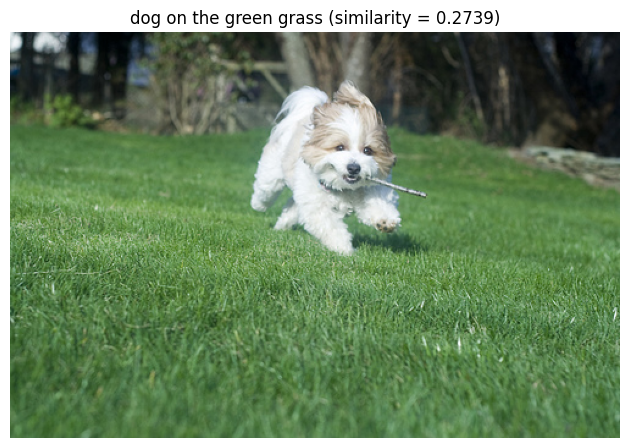

In [ ]:
get_image_with_clip('dog on the green grass')

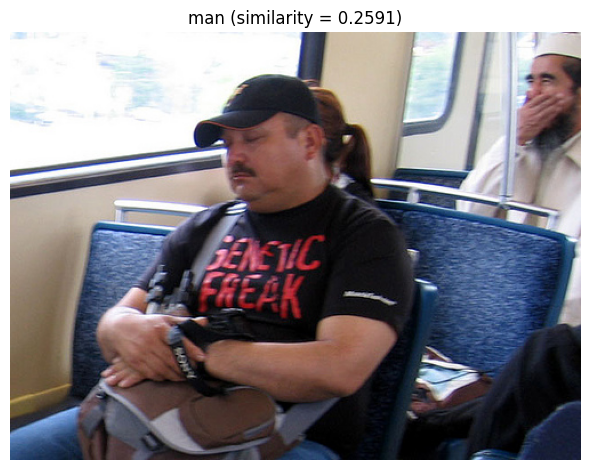

In [ ]:
get_image_with_clip('man')

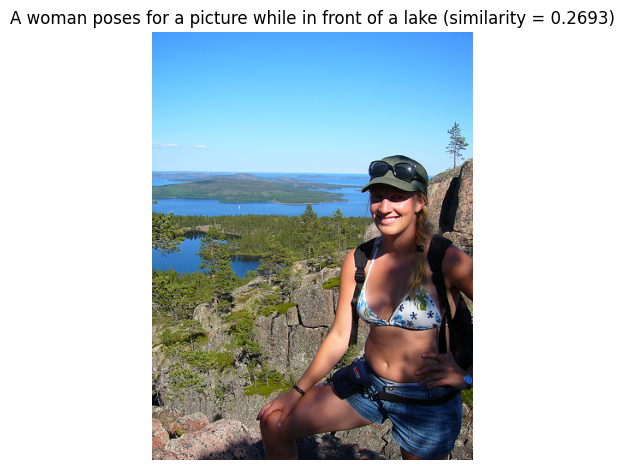

In [ ]:
get_image_with_clip('A woman poses for a picture while in front of a lake')

Использование предобученной модели CLIP дает куда более приемлемые результаты. Все запросы отработали корректно

# 5 - Total conclusion

В рамках данного проекта мы пытались разработать PoC для поиска изображений по текстовому запросу.

Нам было дано 2 набора изображений (для обучения и тестовый), а так же 5 датасетов:
- оценки толпы
- оценки экспертов
- изображения тестовой выборки
- запросы для изображений тестовой выборки
- датасет для обучения

Все датасеты не содержат пропусков и полных дубликатов.

Оценки экспертов и "толпы" были сагрегированы по отдельности, а далее объединены.

Эмбеддинги изображений были получены с помощью *ResNet18*, а текстов с помощью *all-MiniLM-L6-v2*. Далее они конкатенировались и подавались на вход моделям. Было протестированы несколько разных моделей с целевой метрикой *MAE*. Все модели показали неплохой результате (MAE = 0.16 - 0.22), кроме линейной регрессии. Лучше всего справился LGBMRegressor.

Однако финальная модель показала не лучшие результаты. Она улавливает общий смысл (например, что вода или собака), но есть много нюансов (цвета, пол и так далее), где модель не справляется.

Далее была протестирована предобучения модель CLIP. И ее результаты уже более подходят под ТЗ задачи. 3 из 4 запросов были отработаны прекрасно, а один оставшийся имеет что-то общее с запросом, хоть и не соответствует ему.

В результате можно сделать вывод, что на данный момент с имеющимися ресурсами (например, такими маленькими датасетами) создать PoC, имеющий право на жизнь, **НЕвозможно.**